## **Importing files and libraries**

### Libraries

In [1]:
# For Data
import os
#import tqdm
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
#from datetime import datetime
from scipy import  fftpack
#from re import split
import emd
from scipy import ndimage
import statistics

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib import style
from mpl_toolkits.mplot3d import axes3d

# Distributions
#from scipy import stats
#import inspect
#from statsmodels.distributions.empirical_distribution import ECDF

# matplotlib Settings
plt.rcParams['savefig.bbox'] = "tight"
style.use('ggplot') or plt.style.use('ggplot')

# warnings Settings
import warnings
warnings.filterwarnings('ignore')


#Others
from IPython.display import Image
#import numpy as np
#import scipy.fftpack as fourier
#import matplotlib.pyplot as plt
#import scipy.io.wavfile as waves

### Files

#### Load

In [2]:
# Verificar el directorio actual
print("Directorio actual:", os.getcwd())

# Cambiar al directorio superior (bajar un nivel)
os.chdir('../..')

# Verificar el nuevo directorio
print("Nuevo directorio actual:", os.getcwd())

Directorio actual: d:\lenovo\Documents\GitHub\Energy-and-linear-momentum-change-exerted-by-the-solar-wind-for-applications-in-electric-solar-sails-main\Codes\Past
Nuevo directorio actual: d:\lenovo\Documents\GitHub\Energy-and-linear-momentum-change-exerted-by-the-solar-wind-for-applications-in-electric-solar-sails-main


In [3]:
#Function for simply the files load
def dir(r_or_p, year):
    rp = ("Raw", "Calibrated",)
    r_or_p = r_or_p.strip().capitalize()
    if r_or_p not in rp: #Validate data
        raise NameError("Only Raw or Processed")

    if r_or_p == rp[0]:
      dir = f"Data/Raw_converter/{year}.parquet"
      return dir

    else:
      dir = f"Data/Processing_converter/{year}.parquet"

      return dir



In [4]:
#Years that have a analysis
i_year = 1998
f_year = 2023
step_year = 5
other_year = 2000

years = [year for year in range(i_year, f_year + step_year, step_year)] #+ [other_year]

years.sort()

years

[1998, 2003, 2008, 2013, 2018, 2023]

#### Raw data

In [5]:
Raw_data = {}
for year in years:
  Raw_data[year] = pd.read_parquet(dir("Raw",year))


Raw_data

{1998:         YY  MON  DY  DOY:HH:MM:SS     Seconds  SPEED     Np  Vth  N/S  V_He  \
 0       98  Jan   1  001:00:00:30        30.0    361  10.08   32 -0.5   370   
 1       98  Jan   1  001:00:01:00        60.0    358  10.21   31  0.0   366   
 2       98  Jan   1  001:00:01:30        90.0    362  10.08   32 -0.0   371   
 3       98  Jan   1  001:00:02:00       120.0    360  10.09   32 -0.3   369   
 4       98  Jan   1  001:00:02:30       150.0    358  10.71   30 -0.7   366   
 ...     ..  ...  ..           ...         ...    ...    ...  ...  ...   ...   
 619716  98  Dec  21  355:17:27:16  30648436.0    318  13.51   23  5.3   320   
 619717  98  Dec  21  355:17:27:46  30648466.0    317  13.47   23  5.1   320   
 619718  98  Dec  21  355:17:28:16  30648496.0    319  13.08   23  5.1   322   
 619719  98  Dec  21  355:17:28:46  30648526.0    319  11.60   23  5.0   322   
 619720  98  Dec  21  355:17:29:16  30648556.0    324  10.40   23  4.5   327   
 
         GSE_X  GSE_Y  GSE_Z  RA

#### Processed/ Calibrated data

In [6]:
Calibrated_data = {}
for year in years:
  Calibrated_data[year] = pd.read_parquet(dir("Calibrated",year))


Calibrated_data

{1998:        YY  MON  DY  DOY:HH:MM:SS     Seconds  SPEED     Np  Vth  N/S  V_He  \
 0      98  Jan   1  001:00:05:02       302.0    371  10.08   35 -0.8   383   
 1      98  Jan   1  001:00:10:03       603.0    371   9.80   35 -0.9   383   
 2      98  Jan   1  001:00:15:05       905.0    370   9.00   36  0.3   383   
 3      98  Jan   1  001:00:20:11      1211.0    372   7.25   38  1.5   387   
 4      98  Jan   1  001:00:25:10      1510.0    370   8.36   37  0.3   384   
 ...    ..  ...  ..           ...         ...    ...    ...  ...  ...   ...   
 62155  98  Dec  21  355:17:07:38  30647258.0    336  15.01   24  5.6   338   
 62156  98  Dec  21  355:17:12:39  30647559.0    332  14.50   23  3.8   335   
 62157  98  Dec  21  355:17:17:41  30647861.0    334  13.97   24  3.9   337   
 62158  98  Dec  21  355:17:22:43  30648163.0    334  14.58   23  4.7   337   
 62159  98  Dec  21  355:17:27:46  30648466.0    333  13.76   23  4.9   335   
 
        GSE_X  GSE_Y  GSE_Z  RANGE  HGLAT  H

## **Hilbert-Huang Transform** 

In [7]:
def find_best_imf(year, column):
    data_sheet = np.array(Raw_data[year][column])
    calibrated_sheet = np.array(Calibrated_data[year][column])
    time_raw = np.array(Raw_data[year]["Seconds"])
    time_calibrated = np.array(Calibrated_data[year]["Seconds"])

    # Common times between raw and calibrated data
    common_time = np.intersect1d(time_raw, time_calibrated)
    idx_raw_common = np.where(np.isin(time_raw, common_time))[0]
    idx_calibrated_common = np.where(np.isin(time_calibrated, common_time))[0]


    # Run a mask sift
    imf1 = emd.sift.mask_sift(data_sheet)
    imf2 = emd.sift.sift(data_sheet)
    imfc = np.concatenate((imf1, imf2), axis=1)
    # Eliminar columnas duplicadas
    _, unique_indices = np.unique(imfc, axis=1, return_index=True)
    # Seleccionar solo las columnas únicas
    imfs = imfc[:, unique_indices]
    std_devs = np.std(imfs, axis=0)
    # Obtener los índices de las columnas ordenadas por desviación estándar (de mayor a menor)
    sorted_indices = np.argsort(std_devs)
    # Reorganizar las columnas de acuerdo con los índices ordenados
    imf = imfs[:, sorted_indices]


    mse_errors, mae_errors, r2_scores = [], [], []
    I = []
    J = []

    for i in range(imf.shape[1]):
        for j in range(imf.shape[1]):
            filtered_data = np.sum(imf[:,i:j], axis=1)

            # Calculate error metrics on common values
            mse = mean_squared_error(calibrated_sheet[idx_calibrated_common], filtered_data[idx_raw_common])
            mae = mean_absolute_error(calibrated_sheet[idx_calibrated_common], filtered_data[idx_raw_common])
            r2 = r2_score(calibrated_sheet[idx_calibrated_common], filtered_data[idx_raw_common])

            mse_errors.append(mse)
            mae_errors.append(mae)
            r2_scores.append(r2)

            I.append(i)
            J.append(j)

    # Find the optimal cutoff frequency based on each metric
    min_mse_index = np.where(mse_errors == np.min(mse_errors))[0][-1]
    min_mae_index = np.where(mae_errors == np.min(mae_errors))[0][-1]
    max_r2_index = np.where(r2_scores == np.max(r2_scores))[0][-1]

    print(f"The maximum R^2 is {r2_scores[max_r2_index]} for IMF[{I[max_r2_index]+1}:{J[max_r2_index]+1}]")
    print(f"The minimum MSE is {mse_errors[min_mse_index]} for IMF[{I[min_mse_index]+1}:{J[min_mse_index]+1}]")
    print(f"The minimum MAE is {mae_errors[min_mae_index]} for IMF[{I[min_mae_index]+1}:{J[min_mae_index]+1}]")

    # Asegúrate de que los índices estén dentro de los rangos correctos
    max_i = np.max(I)
    max_j = np.max(J)
    min_i = np.min(I)
    min_j = np.min(J)

    # Creamos una matriz de ceros que representa el tablero de ajedrez
    mse_matrix = np.zeros((max_i - min_i + 1, max_j - min_j + 1))
    mae_matrix = np.zeros_like(mse_matrix)
    r2_matrix = np.zeros_like(mse_matrix)

    # Llenar las matrices con los valores de error
    for idx, (i, j) in enumerate(zip(I, J)):
        mse_matrix[i - min_i, j - min_j] = mse_errors[idx]
        mae_matrix[i - min_i, j - min_j] = mae_errors[idx]
        r2_matrix[i - min_i, j - min_j] = r2_scores[idx]

    # Crear la figura con 3 subgráficos
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    # Mapa de calor para MSE
    cax1 = axs[0].imshow(mse_matrix, cmap='inferno')
    fig.colorbar(cax1, ax=axs[0], label='MSE')
    axs[0].set_title('MSE Heatmap')
    axs[0].set_xlabel('Index j')
    axs[0].set_ylabel('Index i')
    axs[0].set_xticks(np.arange(mse_matrix.shape[1]))
    axs[0].set_yticks(np.arange(mse_matrix.shape[0]))
    axs[0].set_xticklabels(np.arange(min_j, max_j+1), rotation=90, ha='right')
    axs[0].set_yticklabels(np.arange(min_i, max_i+1))
    axs[0].grid(False)


    # Mapa de calor para MAE
    cax2 = axs[1].imshow(mae_matrix, cmap='inferno')
    fig.colorbar(cax2, ax=axs[1], label='MAE')
    axs[1].set_title('MAE Heatmap')
    axs[1].set_xlabel('Index j')
    axs[1].set_ylabel('Index i')
    axs[1].set_xticks(np.arange(mae_matrix.shape[1]))
    axs[1].set_yticks(np.arange(mae_matrix.shape[0]))
    axs[1].set_xticklabels(np.arange(min_j, max_j+1), rotation=90, ha='right')
    axs[1].set_yticklabels(np.arange(min_i, max_i+1))
    axs[1].grid(False)

    # Mapa de calor para R²
    cax3 = axs[2].imshow(r2_matrix, cmap='inferno')
    fig.colorbar(cax3, ax=axs[2], label='R²')
    axs[2].set_title('R² Heatmap')
    axs[2].set_xlabel('Index j')
    axs[2].set_ylabel('Index i')
    axs[2].set_xticks(np.arange(r2_matrix.shape[1]))
    axs[2].set_yticks(np.arange(r2_matrix.shape[0]))
    axs[2].set_xticklabels(np.arange(min_j, max_j+1), rotation=90, ha='right')
    axs[2].set_yticklabels(np.arange(min_i, max_i+1))
    axs[2].grid(False)
    
    # Ajustes y mostrar la figura
    plt.grid(False)
    plt.suptitle("Error Metrics Heatmaps (MSE, MAE, R²)")
    plt.show()


    return [I[min_mse_index], I[min_mae_index], I[max_r2_index]], [J[min_mse_index], J[min_mae_index], J[max_r2_index]], imf

The maximum R^2 is 0.690138089405429 for IMF[13:23]
The minimum MSE is 4683.3222459035505 for IMF[13:23]
The minimum MAE is 54.77893845977362 for IMF[13:23]


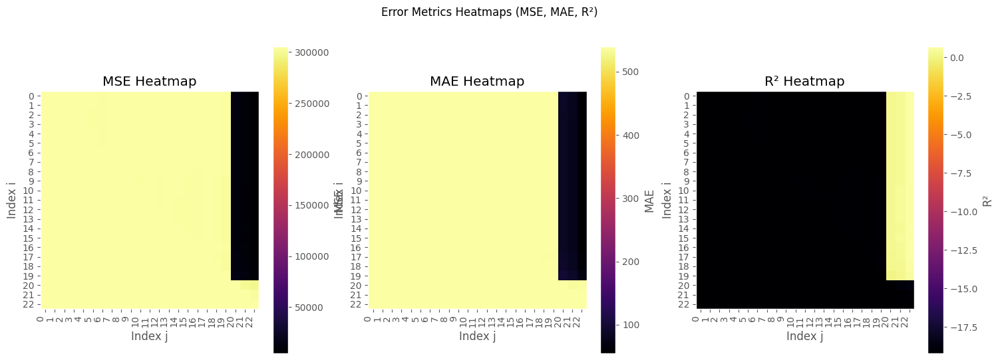

The maximum R^2 is 0.4133866431425096 for IMF[2:24]
The minimum MSE is 9.216521741885146 for IMF[2:24]
The minimum MAE is 2.142876078013275 for IMF[2:24]


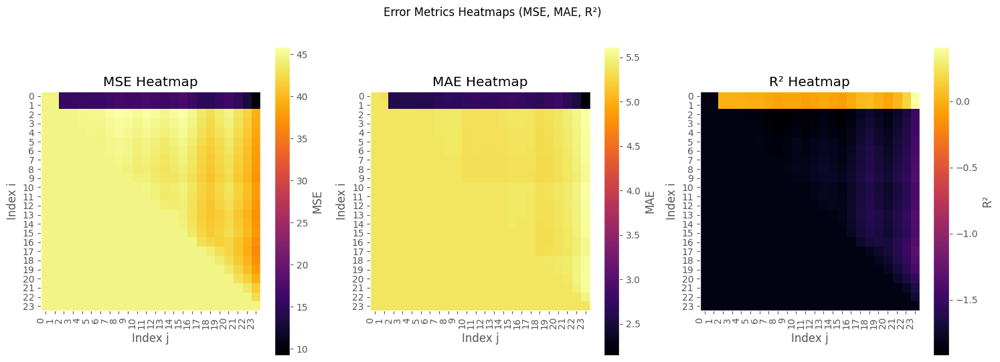

The maximum R^2 is 0.553611001165699 for IMF[2:13]
The minimum MSE is 1.6305288188579574 for IMF[2:13]
The minimum MAE is 0.856547681920646 for IMF[2:13]


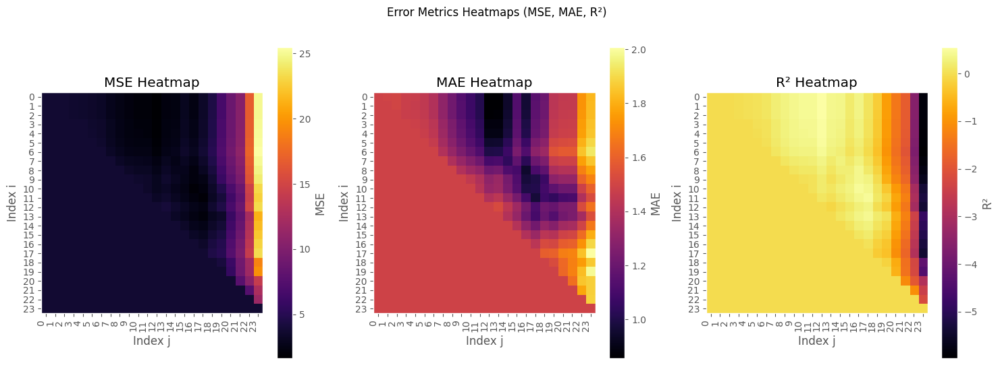

In [8]:
columns = ["SPEED", "Np", "N/S"]

IMF = []
I = []
J = []
for year in [2003]:
    for column in columns:
        # Calculate the sampling frequency and define the range of cutoff frequencies

        # Define and simulate a simple signal
        data_sheet = np.array(Raw_data[year][column])
        calibrated_sheet = np.array(Calibrated_data[year][column])
        time_raw = np.array(Raw_data[year]["Seconds"])
        time_calibrated = np.array(Calibrated_data[year]["Seconds"])

        sample_rate = len(time_raw)/(np.max(time_raw)-np.min(time_raw))

        best_imf = find_best_imf(year, column)
        optimal_cutoffs_i = statistics.mode(best_imf[0])
        optimal_cutoffs_j = statistics.mode(best_imf[1])
        imf = best_imf[2]

        IMF.append(imf)
        I.append(optimal_cutoffs_i)
        J.append(optimal_cutoffs_j)

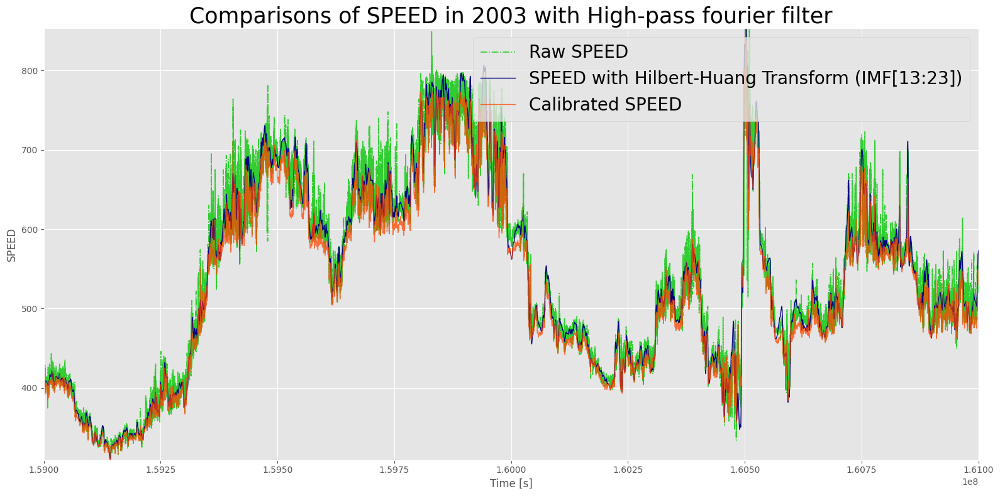

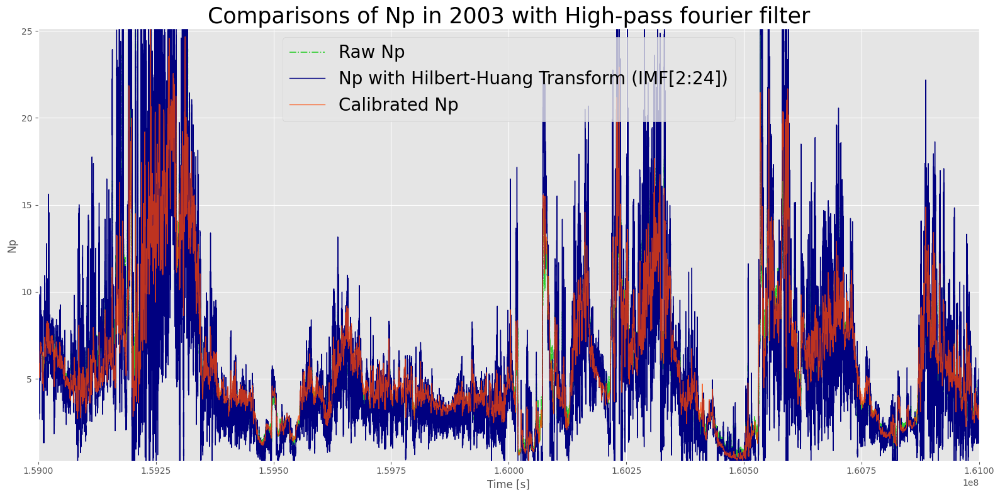

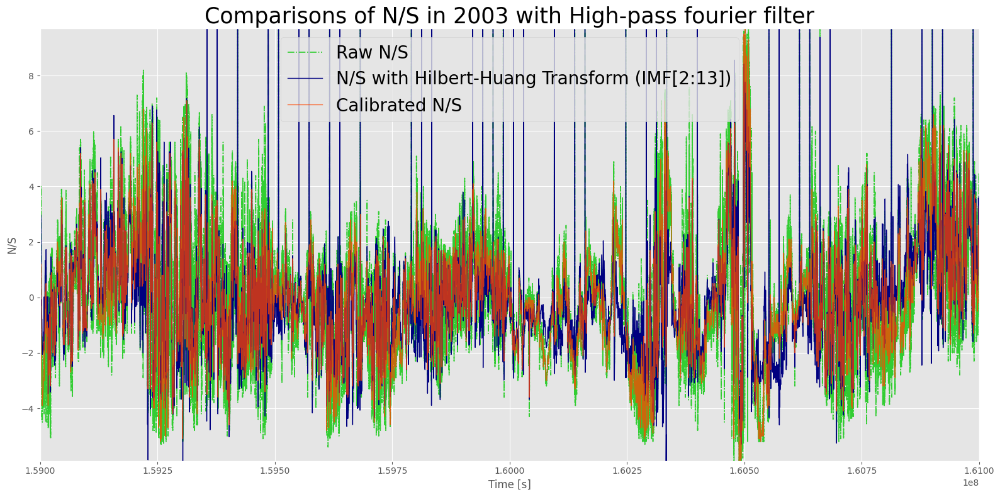

In [9]:
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column in zip(IMF, I, J, columns):
        # Define and simulate a simple signal
        data_sheet = np.array(Raw_data[year][column])
        calibrated_sheet = np.array(Calibrated_data[year][column])
        time_raw = np.array(Raw_data[year]["Seconds"])
        time_calibrated = np.array(Calibrated_data[year]["Seconds"])


        # Plot the original signal and the filtered signal for each optimal frequency
        plt.figure(figsize=(16, 8))
        plt.plot(time_raw, data_sheet, label=f'Raw {column}', color="limegreen", linewidth=1.2, linestyle="-.")
        plt.plot(time_raw, np.sum(imf[:,optimal_cutoffs_i:optimal_cutoffs_j+1], axis=1), label=f'{column} with Hilbert-Huang Transform (IMF[{optimal_cutoffs_i+1}:{optimal_cutoffs_j+1}])', color="navy", linewidth=1, linestyle="-")
        plt.plot(time_calibrated, calibrated_sheet, label=f'Calibrated {column}', color="orangered", linewidth=1, linestyle="-", alpha=0.75)
        plt.title(f'Comparisons of {column} in {year} with High-pass fourier filter', fontsize=25)
        plt.xlabel('Time [s]')
        plt.ylabel(column)

        # Valores objetivo
        tmin = 1.59e8 
        tmax = 1.61e8
        # Encuentra los índices de los valores en `x` más cercanos a los objetivos
        idx_t_min = np.argmin(np.abs(Calibrated_data[year]["Seconds"] - tmin))
        idx_t_max = np.argmin(np.abs(Calibrated_data[year]["Seconds"] - tmax))
        # Asegura que index1 sea menor que index2 para definir correctamente el rango
        start_idx, end_idx = sorted((idx_t_min, idx_t_max))
        # Encuentra el mínimo y el máximo en el rango de `z` especificado por `start_index` y `end_index`
        y_min = np.min(Calibrated_data[year][column][start_idx:end_idx + 1])
        y_max = np.max(Calibrated_data[year][column][start_idx:end_idx + 1])

        plt.xlim(tmin, tmax)
        plt.ylim(y_min, y_max)
        plt.legend(fontsize=20)
        plt.tight_layout()
        plt.show()

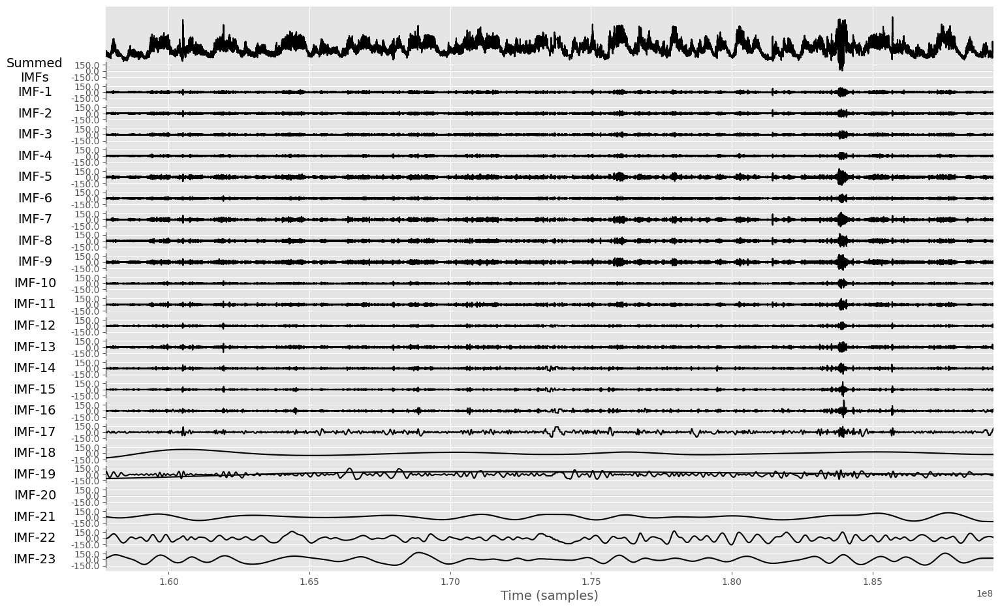

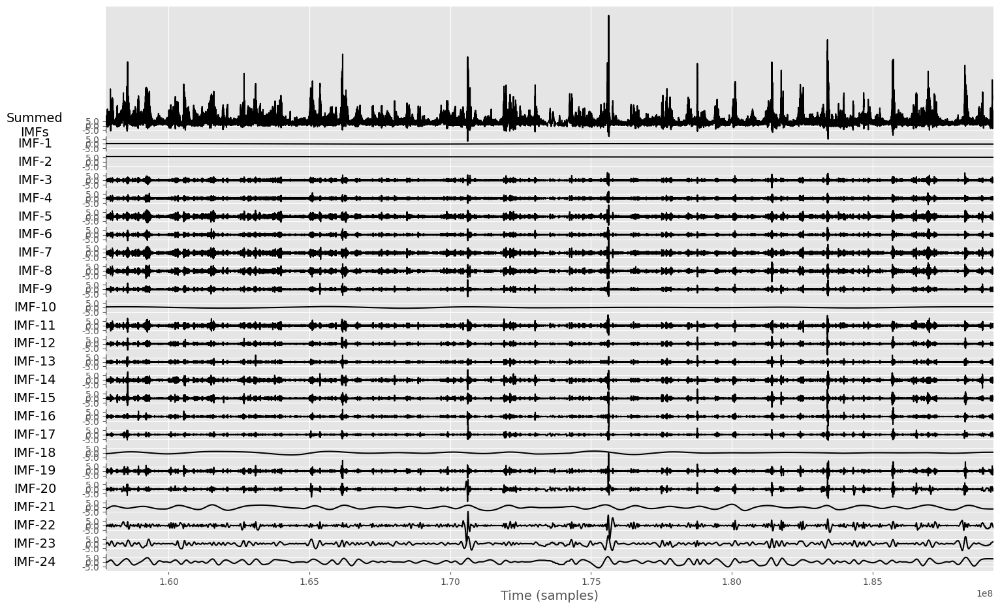

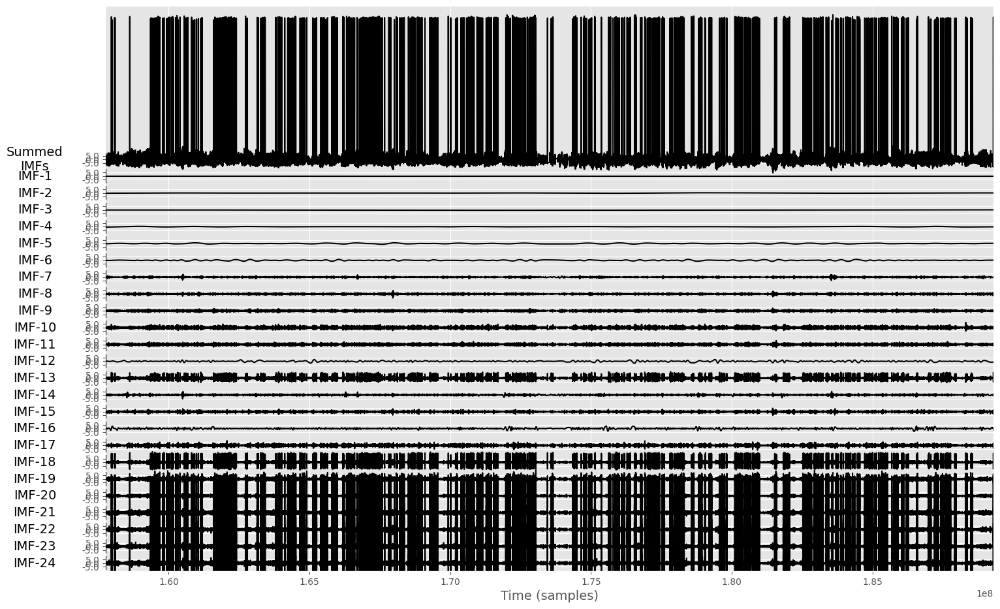

In [10]:
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column in zip(IMF, I, J, columns):
        # Define and simulate a simple signal
        data_sheet = np.array(Raw_data[year][column])
        calibrated_sheet = np.array(Calibrated_data[year][column])
        time_raw = np.array(Raw_data[year]["Seconds"])
        time_calibrated = np.array(Calibrated_data[year]["Seconds"])

        emd.plotting.plot_imfs(imf, time_vect=time_raw, cmap="Inferno")

In [11]:
IPs, IFs, IAs, Suw, Sw, fe, fc, F = [], [], [], [], [], [], [], []
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column in zip(IMF, I, J, columns):
        # Define and simulate a simple signal
        data_sheet = np.array(Raw_data[year][column])
        calibrated_sheet = np.array(Calibrated_data[year][column])
        time_raw = np.array(Raw_data[year]["Seconds"])
        time_calibrated = np.array(Calibrated_data[year]["Seconds"])

        # Compute frequency statistics
        IP, IF, IA = emd.spectra.frequency_transform(imf, sample_rate, 'nht')
        freq_edges, freq_centres = emd.spectra.define_hist_bins(np.min(IF), np.max(IF), 100)
        # Amplitude weighted HHT per IMF
        f, spec_weighted = emd.spectra.hilberthuang(IF, IA, freq_edges, sum_imfs=False)
        # Unweighted HHT per IMF - we replace the instantaneous amplitude values with ones
        f, spec_unweighted = emd.spectra.hilberthuang(IF, np.ones_like(IA), freq_edges, sum_imfs=False)
        # Usar la función 'hilberthuang' para calcular el espectro de Hilbert (HHT)
        """
        f, hht = emd.spectra.hilberthuang(IF, IA, freq_edges, mode='amplitude', sum_time=False)

        # Plot the Hilbert spectrum
        plt.figure(figsize=(10, 8))
        plt.pcolormesh(time_raw, f, hht, cmap='hot', shading='auto')
        plt.colorbar(label='Amplitude')
        plt.xlabel('Time (samples)')
        plt.ylabel('Frequency (Hz)')
        plt.title('Hilbert Spectrum')
        plt.ylim(0, np.max(f))
        plt.show()
        """

        IPs.append(IP)
        IFs.append(IF)
        IAs.append(IA)
        Suw.append(spec_unweighted)
        Sw.append(spec_weighted)
        fe.append(freq_edges)
        fc.append(freq_centres)
        F.append(f)

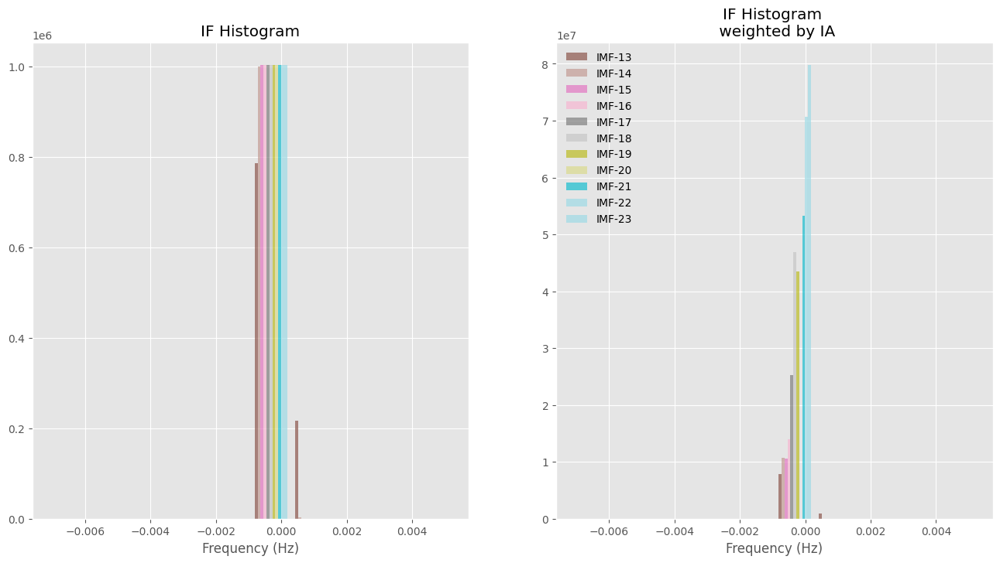

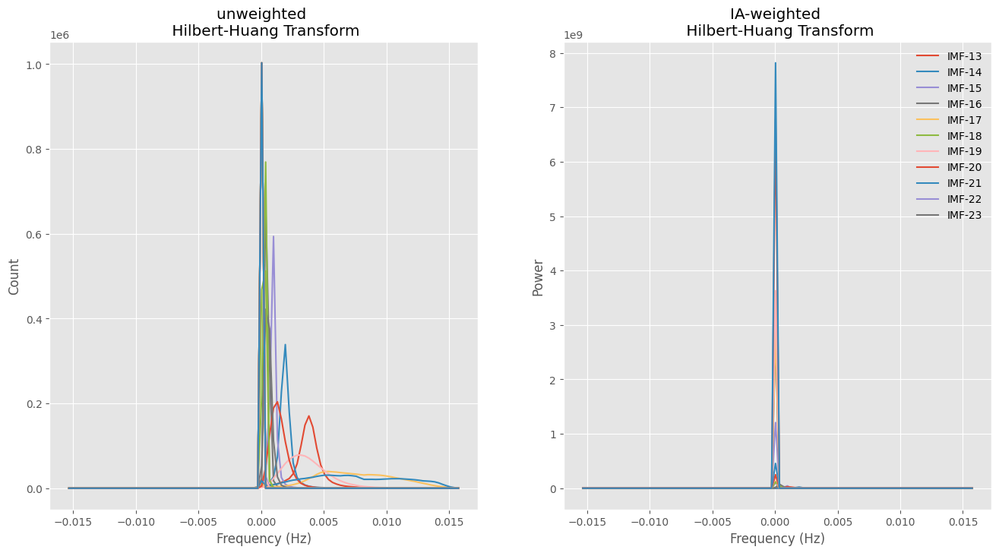

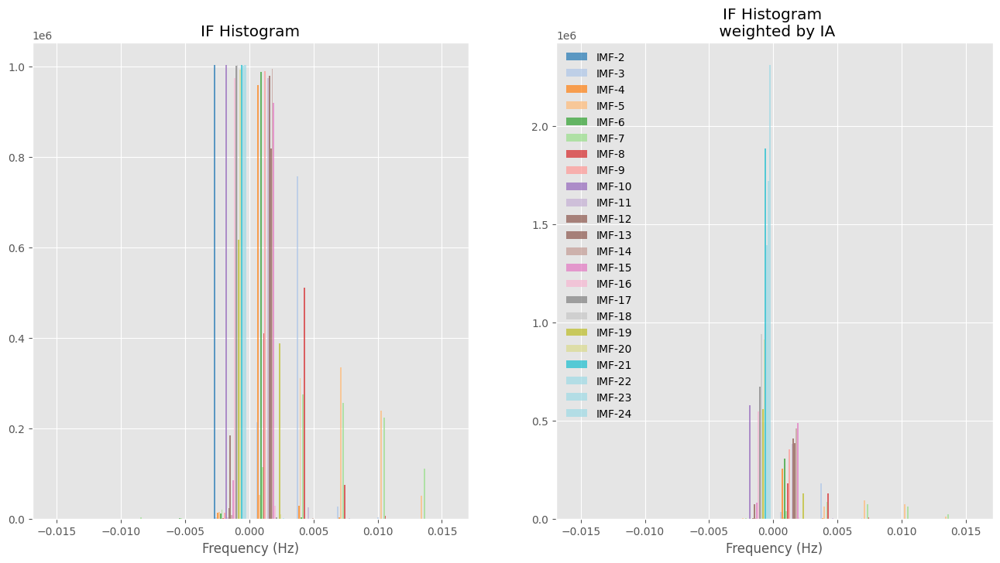

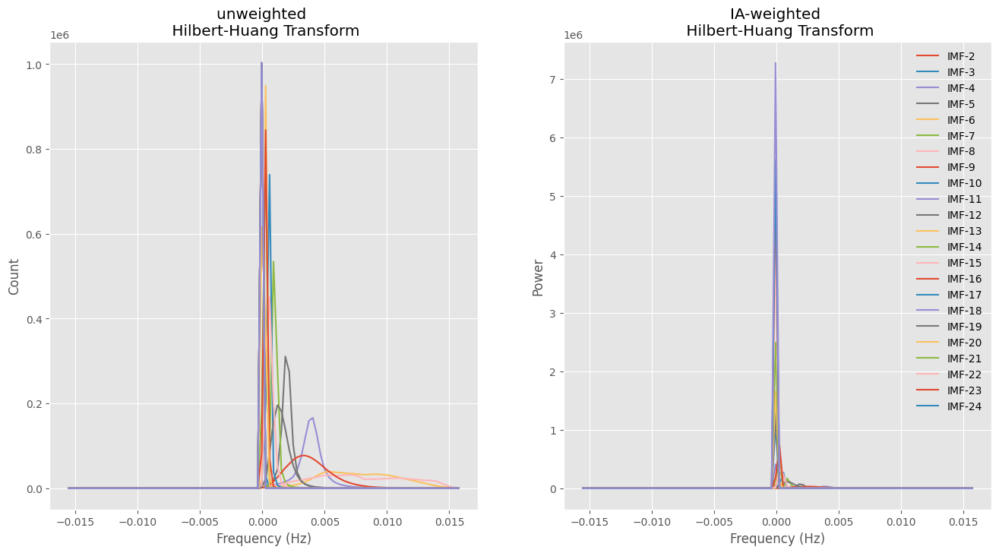

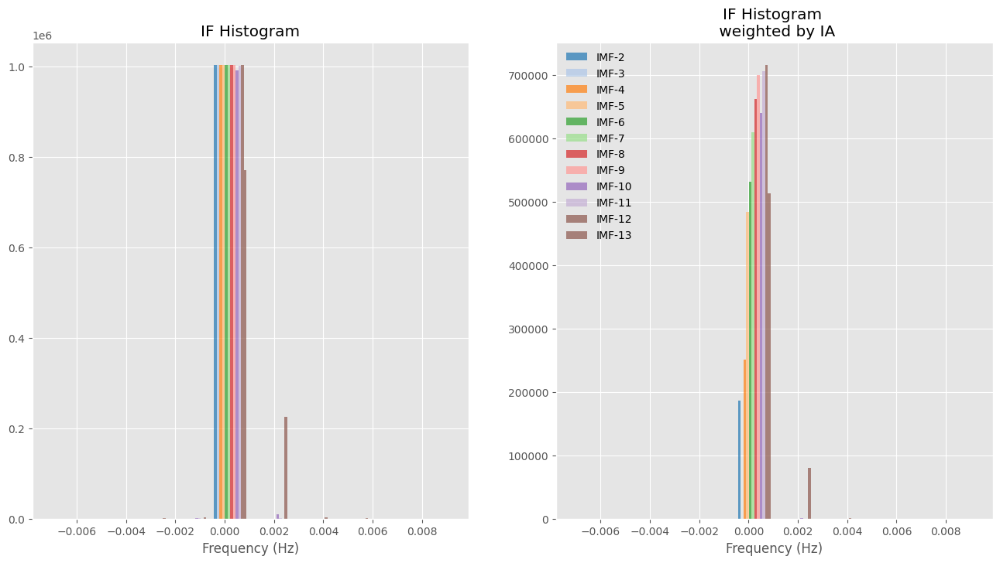

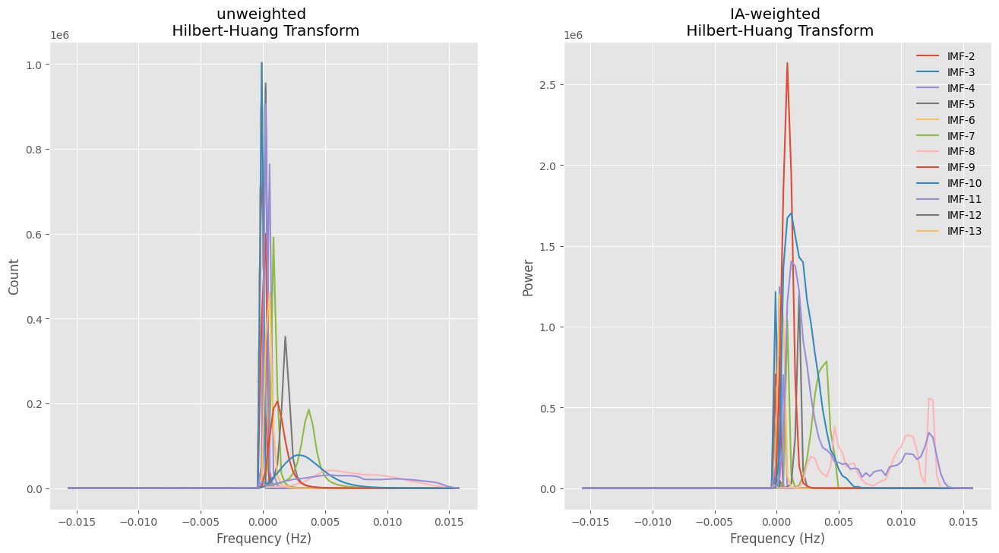

In [12]:
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column, IP, IF, IA, spec_unweighted, spec_weighted, freq_edges, freq_centres, f  in zip(IMF, I, J, columns, IPs, IFs, IAs, Suw, Sw, fe, fc, F):

        colores = [plt.cm.tab20(i/22) for i in range(optimal_cutoffs_i, optimal_cutoffs_j+1,1)]

        plt.figure(figsize=(16, 8))
        plt.subplot(121)
        # Plot a simple histogram using frequency bins from 0-20Hz
        plt.hist(IF[:,optimal_cutoffs_i:optimal_cutoffs_j+1 ], color=colores, alpha=0.7)
        plt.grid(True)
        plt.title('IF Histogram')
        #plt.xticks(np.arange(0, 20, 5))
        plt.xlabel('Frequency (Hz)')
        plt.subplot(122)
        # Plot an amplitude-weighted histogram using frequency bins from 0-20Hz
        plt.hist(IF[:,optimal_cutoffs_i:optimal_cutoffs_j+1], weights=IA[:,optimal_cutoffs_i:optimal_cutoffs_j+1], color=colores, alpha=0.7)
        plt.grid(True)
        plt.title('IF Histogram \n weighted by IA')
        #plt.xticks(np.arange(0, 20, 5))
        plt.xlabel('Frequency (Hz)')
        plt.legend([f'IMF-{i+1}' for i in range(optimal_cutoffs_i, optimal_cutoffs_j+1,1)], frameon=False)
        plt.show()




        plt.figure(figsize=(16, 8))
        plt.subplots_adjust(hspace=0.4)
        plt.subplot(121)
        plt.plot(freq_centres, spec_unweighted)
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Count')
        plt.title('unweighted \n Hilbert-Huang Transform')
        plt.subplot(122)
        plt.plot(freq_centres, spec_weighted)
        plt.xlabel('Frequency (Hz)')
        plt.ylabel('Power')
        plt.title('IA-weighted \n Hilbert-Huang Transform')
        plt.legend([f'IMF-{i+1}' for i in range(optimal_cutoffs_i, optimal_cutoffs_j+1,1)], frameon=False)

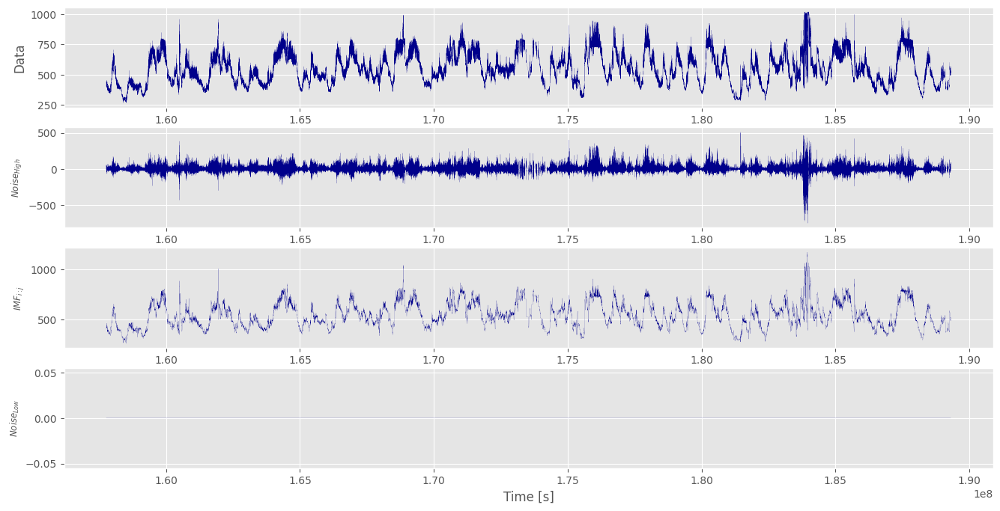

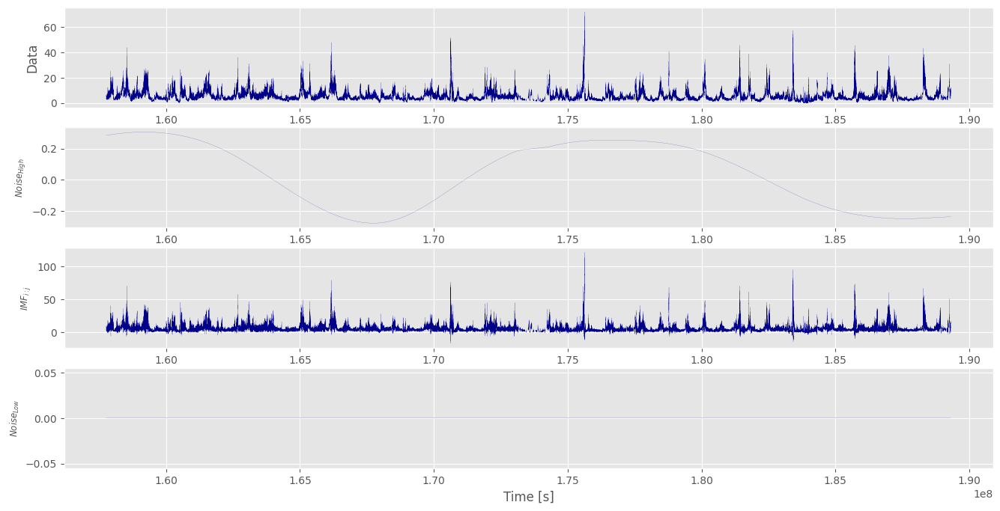

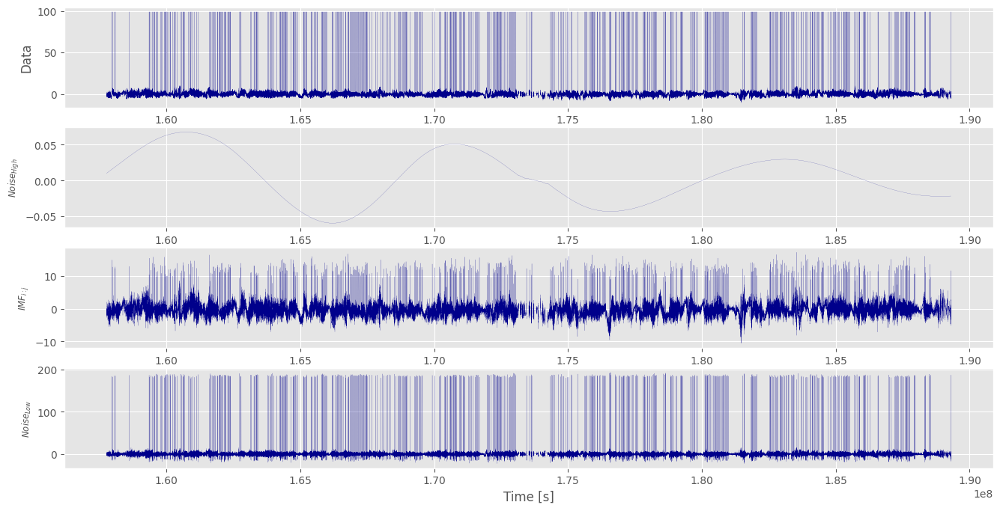

In [21]:
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column, IP, IF, IA  in zip(IMF, I, J, columns, IPs, IFs, IAs):
        
        hi_noise = np.sum(imf[:,:optimal_cutoffs_i], axis=1)
        c = np.sum(imf[:,optimal_cutoffs_i:optimal_cutoffs_j+1], axis=1) 
        low_noise = np.sum(imf[:,optimal_cutoffs_j+1:], axis=1)

        plots = [Raw_data[year][column], hi_noise, c, low_noise]
        labels = ['Data', r'$_{Noise_{High}}$', r'$_{IMF_{i:j}}$', r'$_{Noise_{Low}}$' ]
        plt.figure(figsize=(16,8))
        for i in range(len(plots)):
            plt.subplot(len(plots), 1,i+1)
            plt.plot(time_raw, plots[i], c="darkblue", linewidth=0.1)
            plt.ylabel(labels[i])
        plt.xlabel("Time [s]")
        plt.show()

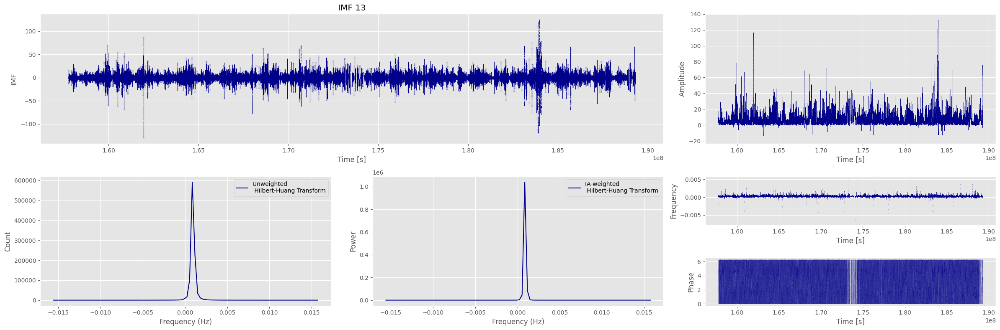

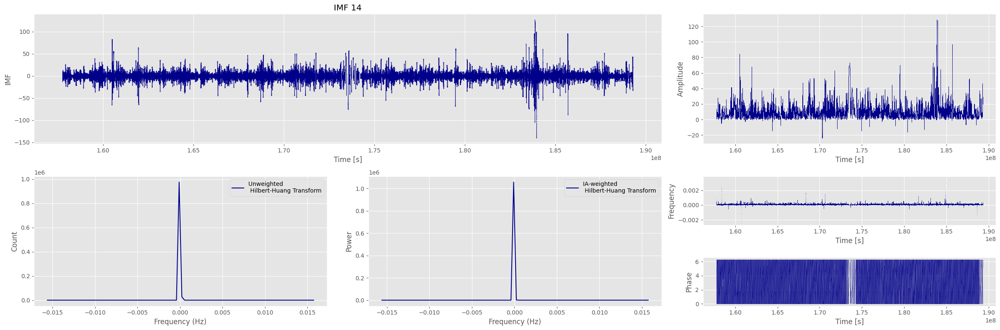

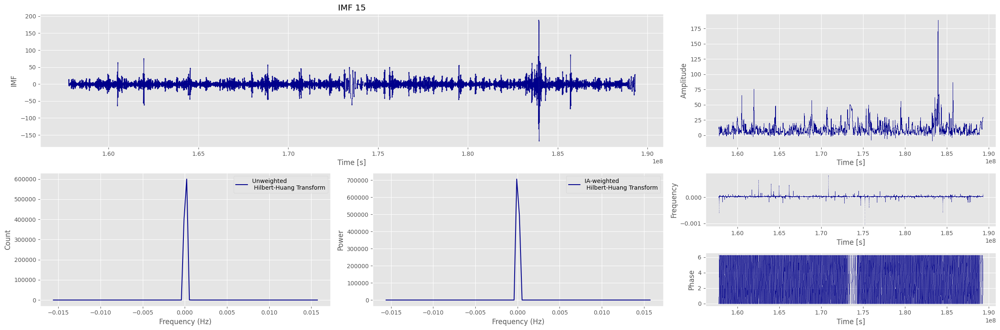

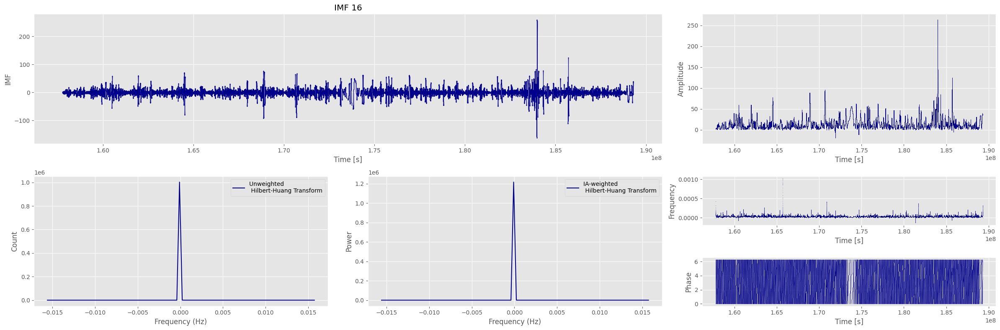

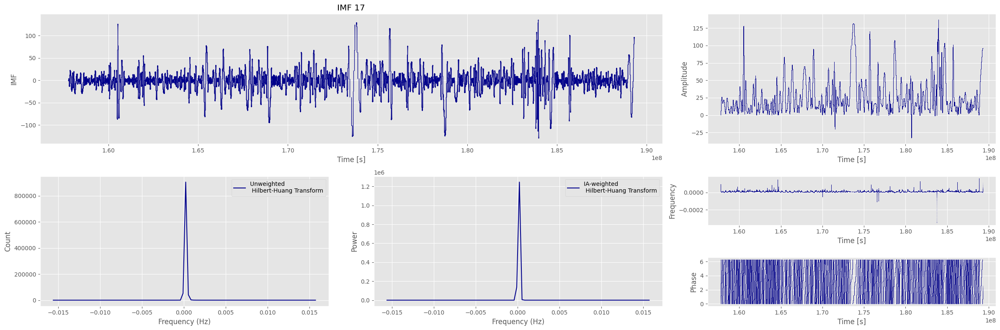

...

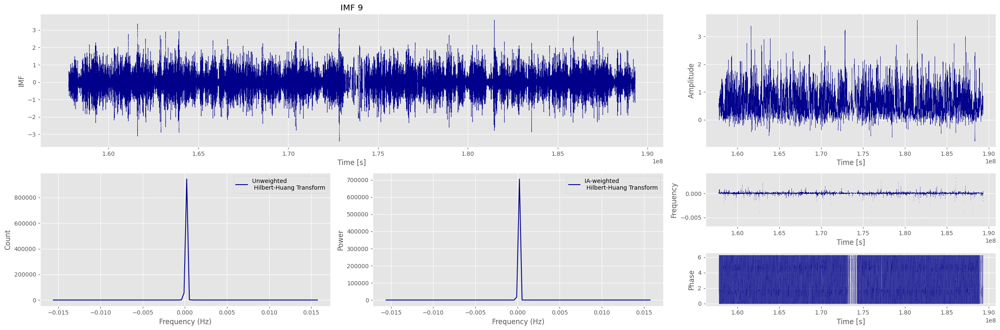

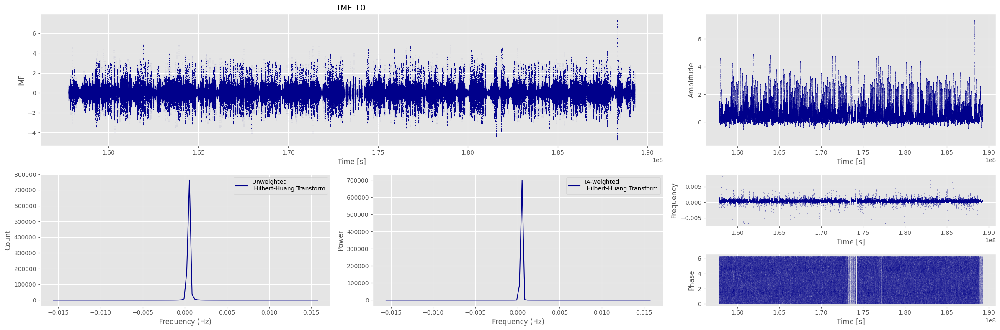

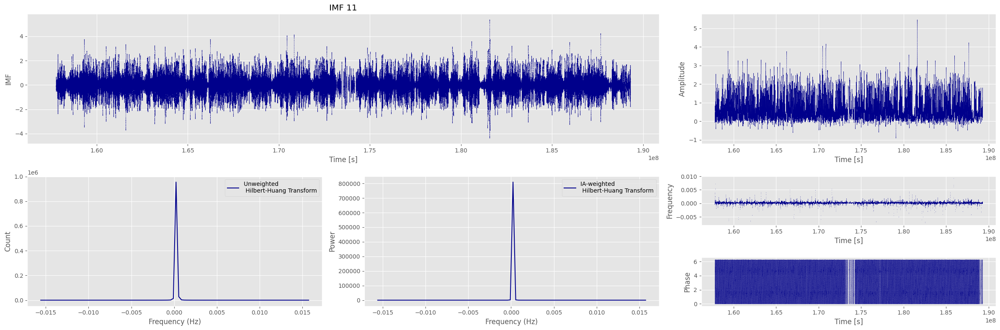

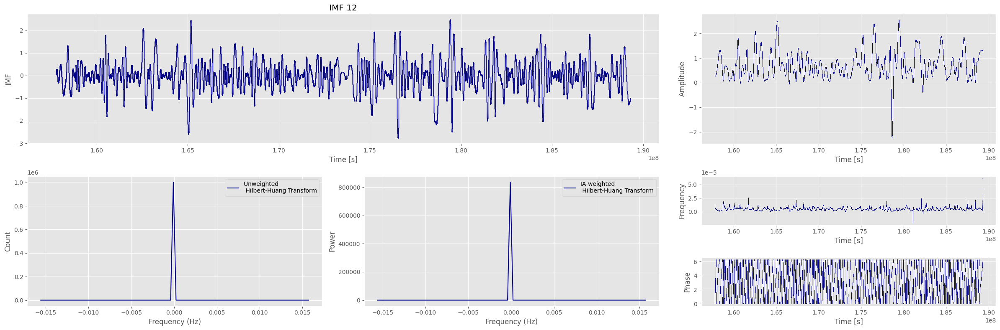

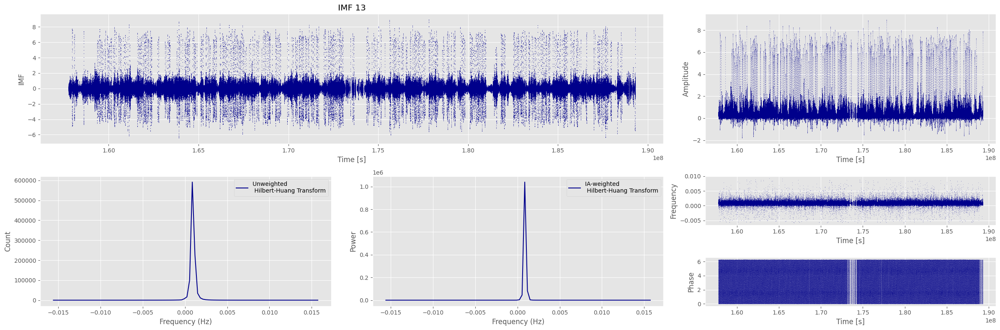

In [14]:
for imf, optimal_cutoffs_i, optimal_cutoffs_j, column, IP, IF, IA  in zip(IMF, I, J, columns, IPs, IFs, IAs):
        for i in range(optimal_cutoffs_i, optimal_cutoffs_j+1,1):
            # Crear la figura con un tamaño ajustado
            plt.figure(figsize=(24, 8))

            # Usar GridSpec para ajustar el tamaño de las subgráficas
            gs = gridspec.GridSpec(4, 3)  # Dos filas y 5 columnas

            
            # Subgráfico 1: Instantaneous Amplitude (IA)
            ax1 = plt.subplot(gs[:2, :2])  # Primer subgráfico con más espacio
            ax1.scatter(time_raw, imf[:,i], c="Darkblue", s=1e-1)
            ax1.set_ylabel("IMF")
            ax1.set_xlabel('Time [s]')
            
            plt.title(f'IMF {i+1}')

            # Subgráfico 1: Instantaneous Amplitude (IA)
            ax2 = plt.subplot(gs[:2, 2])  # Primer subgráfico con más espacio
            ax2.scatter(time_raw, IA[:,i], c="Darkblue", s=1e-2)
            ax2.set_ylabel("Amplitude")
            ax2.set_xlabel('Time [s]')
            
            # Subgráfico 2: Instantaneous Frequency (IF) (parte de la segunda columna, primera fila)
            ax3 = plt.subplot(gs[2, 2])  # Segundo subgráfico
            ax3.scatter(time_raw, IF[:,i], c="Darkblue", s=1e-2)
            ax3.set_ylabel("Frequency")
            ax3.set_xlabel('Time [s]')
            
            # Subgráfico 3: Instantaneous Phase (IP) (segunda fila)
            ax4 = plt.subplot(gs[3, 2])  # Tercer subgráfico, misma columna que IF pero en la segunda fila
            ax4.scatter(time_raw, IP[:,i], c="Darkblue", s=1e-3)
            ax4.set_ylabel("Phase")
            ax4.set_xlabel('Time [s]')

            # Subgráfico 4: Unweighted Hilbert-Huang Transform Spectrum
            ax5 = plt.subplot(gs[2:, 0])  # Cuarto subgráfico
            ax5.plot(freq_centres, spec_unweighted[:,i], label='Unweighted \n Hilbert-Huang Transform', c="Darkblue")
            ax5.set_xlabel('Frequency (Hz)')
            ax5.set_ylabel('Count')
            ax5.legend()

            # Subgráfico 5: IA-weighted Hilbert-Huang Transform Spectrum
            ax6 = plt.subplot(gs[2:, 1])  # Quinto subgráfico
            ax6.plot(freq_centres, spec_weighted[:,i], label='IA-weighted \n Hilbert-Huang Transform', c="Darkblue")
            ax6.set_xlabel('Frequency (Hz)')
            ax6.set_ylabel('Power')
            ax6.legend()

            # Mostrar la figura
            plt.tight_layout()
            plt.show()
